# 🐶 Multi-Class Dog Breed Classification Project
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Build a model that is able to identify the breed of a dog from a given image.

## 2. Data
The data being used in the project is from Kaggle's Dog Breed Identification Competition:

https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation
The evaluation for this project is a submission file that contains the id of each image followed by the predicted probabilities for each of the different breeds.

## 4. Features
* The data being used in the project is a collection of images (unstructured data).
* There are 120 different dog breeds within the given images (meaning there is 120 different classes or features).
* There are about 10,000+ images within the training dataset (these images contain labels for the model to be trained on).
* There are about 10,000+ images within the testing dataset (these images do not contain labels as these are the images the model will attempt to predict the labels).

### Get the workspace ready

* Import TensorFlow ✔️
* Import TensorFlow Hub ✔️
* Ensure we are using a GPU ✔️

In [3]:
# Import TensorFlow and TensorFlow Hub
import tensorflow as tf
import tensorflow_hub as hub

# Check which versions are imported
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.17.1
TF Hub version: 0.16.1
GPU not available


### Prepare the Data
With all machine learning models, our data needs to be in a numerical format. Obviously images are not numeric, so we will turn them into Tensors so that the models can process them.

In [4]:
# Checkout the labels of the data
import pandas as pd

labels = pd.read_csv("/content/drive/MyDrive/TensorFlow/Dog Vision/labels.csv")
labels.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


<Axes: xlabel='breed'>

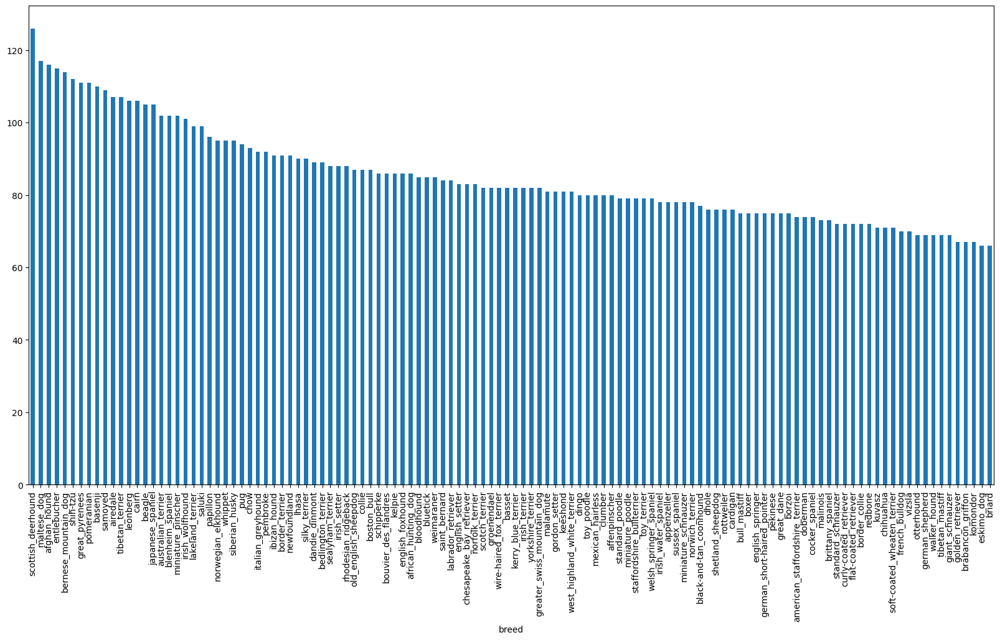

In [5]:
# Take a look at how many images there are of each breed in the training set using a bar plot
labels["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
# Check the max and min values of the value counts
print(f"Max Breed in the Training Data: {labels['breed'].value_counts().index[0]} - {labels['breed'].value_counts().values[0]}")
print(f"Min Breed in the Training Data: {labels['breed'].value_counts().index[-1]} - {labels['breed'].value_counts().values[-1]}")

Max Breed in the Training Data: scottish_deerhound - 126
Min Breed in the Training Data: briard - 66


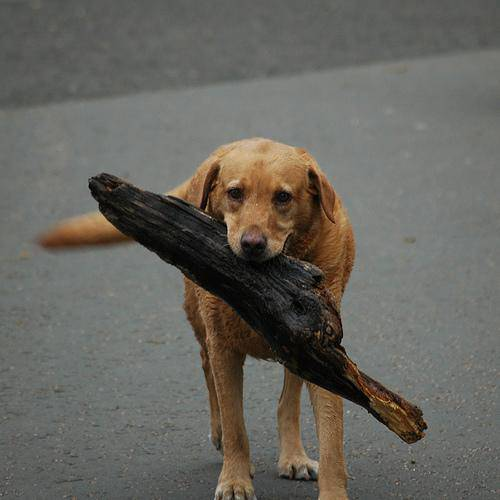

In [7]:
# View an Image
from PIL import Image
Image.open("/content/drive/MyDrive/TensorFlow/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Get Images and their Labels
Let's get a list of all of the training images filepaths

In [8]:
# Create the image pathnames from the image ID's
filepaths = ["/content/drive/MyDrive/TensorFlow/Dog Vision/train/" + id for id in labels['id'] + ".jpg"]

# Check the first 10
filepaths[:10]

['/content/drive/MyDrive/TensorFlow/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/TensorFlow/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

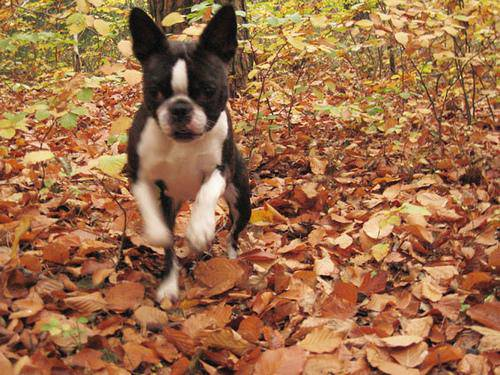

In [9]:
# Try opening one of the images using the created paths
Image.open(filepaths[0])

In [10]:
# Check the Breed of the image above
labels['breed'][0]

'boston_bull'

In [11]:
# Check to see if the length of the filepaths == the number of images in the train folder
import os
if len(filepaths) == len(os.listdir("/content/drive/MyDrive/TensorFlow/Dog Vision/train")):
  print("Filepaths and images in the train folder match!")
else:
  print("Filepaths and images in the train folder do not match!")

Filepaths and images in the train folder match!


### Prepare the Labels

In [12]:
# Transform the labels into a numpy array
import numpy as np
labels_array = np.array(labels['breed'])
labels_array

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
# Check the number of labels to the number of filenames
if len(labels_array) == len(filepaths):
  print("Labels and filepaths match!")
else:
  print("Labels and filepaths do not match!")

Labels and filepaths match!


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels_array)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [15]:
# Turn the labels into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels_array]

# View the first 5
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Create out own Validation dataset

In [16]:
# Create our X and y variables
X = np.array(filepaths)
y = np.array(boolean_labels)

# Check the len of the vars
len(X), len(y)

(10222, 10222)

### Start off with ~1000 images to experiment on and increase as needed

In [17]:
# Set param to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [18]:
# Split the data into train and validation sets
from sklearn.model_selection import train_test_split

# Set random seed
np.random.seed(42)

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

# Check the len of our new data sets
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

### Turning Images into Tensors
Create a function that:
1. Takes an image filepath as input ✔️
2. Use TensorFlow to read the file and save it into a variable `image` ✔️
3. Turn our `image` into Tensors ✔️
4. Normalize the images color channel values ✔️
5. Resize the `image`to shape (224, 224) ✔️
6. Return the modified image ✔️

In [19]:
# Define Image Size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the image into a Tensor
  image = tf.image.decode_jpeg(image, channels=3)

  # Normalize the image - makes computing more effiecient
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  # Return the modified image
  return image

### Turn our data into Batches

In [20]:
# Create a helper function that returns a tuple (image, label)
def get_image_label(image_path, label):
  # Turn the image path into a Tensor
  image = process_image(image_path)

  # Return the tuple
  return image, label

### Create a function that turns our data into batches

In [21]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches - can handle train, valid, or test data
def create_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # Test data set - no y (labels)
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only image filepaths
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # Valid data set - will have y (labels), do not need to shuffle
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # image filepaths and labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  # Training data set - will have y (labels), need to shuffle data
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # image filepaths and labels
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

In [22]:
# Create training and validation data batches
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [23]:
# Check out the attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualize Data Batches

In [24]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  # Create the figure
  plt.figure(figsize=(10, 10))

  # Loop through 25 images
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])

    # Add image label
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn off gridlines
    plt.axis("off")

  # Show the plot
  plt.show()

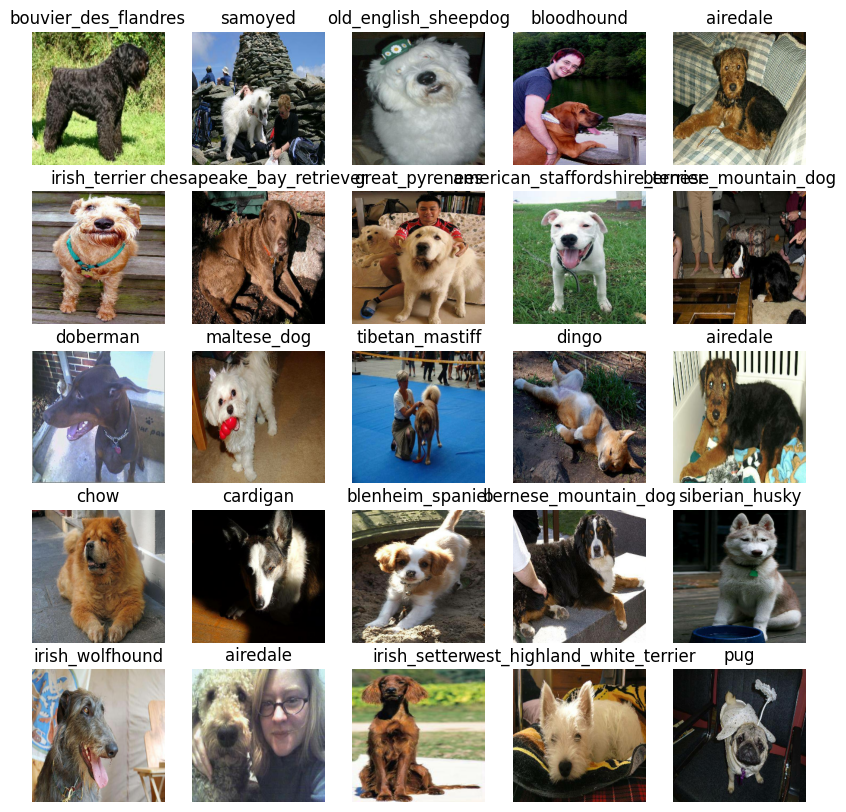

In [25]:
# Unbatch the data so we can visualize it
train_images, train_labels = next(train_data.as_numpy_iterator())

# Show the first 25 images
show_25_images(train_images, train_labels)

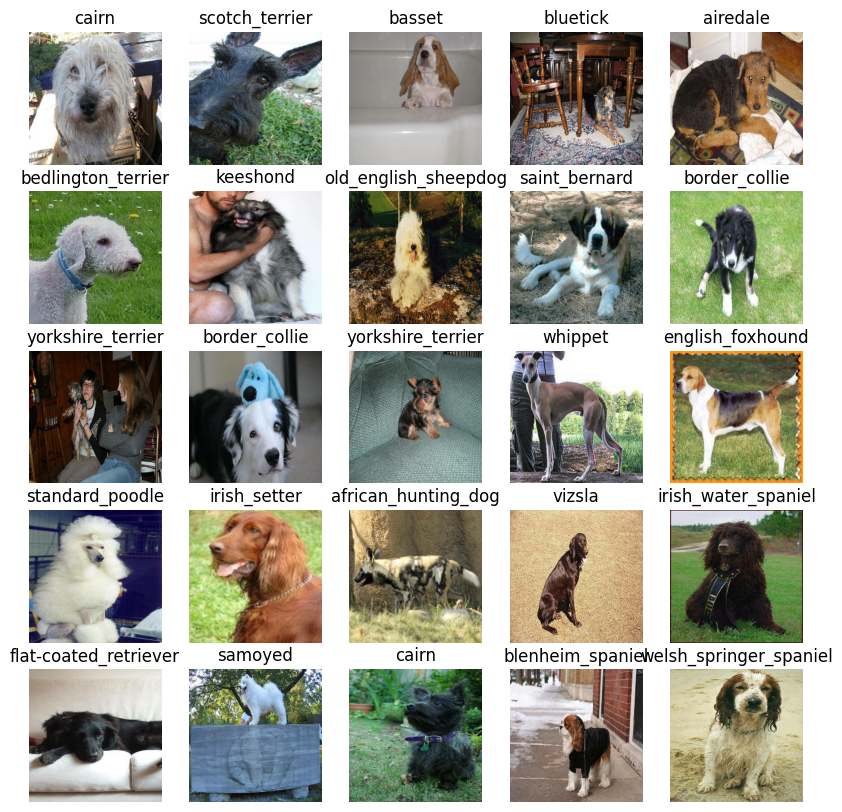

In [26]:
# Visualize the validation data
val_images, val_labels = next(val_data.as_numpy_iterator())

# Show the first 25 images
show_25_images(val_images, val_labels)

### Prepare the Inputs and Outputs

In [27]:
# Setup input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true"

In [28]:
import tf_keras as keras

# Create the model
model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Input Layer
    keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Output Layer
])

# Compile the model
model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
    metrics=["accuracy"]
)

# Build the model
model.build(INPUT_SHAPE)

In [29]:
# Show the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating Callbacks
Callbacks are helper functions a model can use during training to do things such as save its progress, check its progress, or stop training early if a model stops improving

In [30]:
# Load TensorBoard notebook extention
%load_ext tensorboard

In [31]:
import datetime as dt

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/TensorFlow/Dog Vision/logs", dt.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return keras.callbacks.TensorBoard(logdir)

In [32]:
# Create an early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

### Train the Model

In [33]:
# Create a param for the num of epochs
NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max: 100, step: 10}

In [34]:
# Create a new Tensorboard session
tensorboard = create_tensorboard_callback()

In [35]:
# Fit the model to the data
model.fit(
    x=train_data,
    epochs=NUM_EPOCHS,
    validation_data=val_data,
    validation_freq=1,
    callbacks=[tensorboard, early_stopping]
)

Epoch 1/100
25/25 [==============================] - 245s 10s/step - loss: 4.6145 - accuracy: 0.0800 - val_loss: 3.4707 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 67s 3s/step - loss: 1.6453 - accuracy: 0.7013 - val_loss: 2.1577 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 66s 3s/step - loss: 0.5617 - accuracy: 0.9350 - val_loss: 1.6480 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 76s 3s/step - loss: 0.2515 - accuracy: 0.9887 - val_loss: 1.4793 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 68s 3s/step - loss: 0.1495 - accuracy: 0.9962 - val_loss: 1.4028 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 61s 2s/step - loss: 0.1014 - accuracy: 0.9987 - val_loss: 1.3490 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 70s 3s/step - loss: 0.0754 - accuracy: 0.9987 - val_loss: 1.3177 - val_accuracy: 0.6650


In [36]:
# Check TensorBoard logs
%tensorboard --logdir /content/drive/MyDrive/TensorFlow/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

### Make and Evaluate Predictions using the Trained Model

In [37]:
# Make predcitons on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 13s 2s/step


array([[2.9606349e-03, 2.7369714e-04, 4.7071520e-03, ..., 1.4402875e-03,
        7.3944648e-05, 5.2451564e-04],
       [2.3092625e-03, 2.3786158e-03, 5.2120765e-03, ..., 1.2094782e-03,
        8.9987768e-03, 7.5488258e-04],
       [4.3750225e-04, 1.3720412e-04, 1.1539704e-04, ..., 4.3804166e-04,
        1.8907426e-04, 9.3222345e-04],
       ...,
       [1.8939329e-05, 6.1573337e-05, 7.4588919e-05, ..., 2.1714554e-04,
        7.7773890e-05, 2.2580467e-04],
       [2.4579188e-03, 2.1557331e-04, 2.4214317e-04, ..., 3.8241028e-04,
        1.6989716e-04, 1.0474865e-02],
       [8.3988946e-04, 3.1481741e-05, 3.0232850e-03, ..., 6.7676180e-03,
        8.8921259e-04, 4.8131292e-04]], dtype=float32)

In [38]:
predictions.shape # 200 images 120 labels

(200, 120)

In [39]:
np.sum(predictions[0]), np.sum(predictions[1]) # each row sums to ~1

(1.0, 0.99999994)

In [40]:
# Check a prediction
index = 21
print(predictions[index])
print(f"Max value: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.28124404e-05 3.05156922e-04 1.86388588e-05 1.44761580e-05
 8.75319965e-05 1.48731458e-04 3.39694197e-05 3.59522266e-04
 2.22667833e-04 1.03164411e-05 9.30523020e-05 1.05235225e-03
 8.56749557e-06 1.50790947e-04 3.76434531e-04 5.71310693e-06
 8.12121318e-04 2.15790307e-04 3.91722599e-04 6.15848330e-06
 4.39136456e-05 1.83027820e-03 8.23413484e-06 2.41646612e-05
 5.54553291e-04 1.96564488e-05 2.14470900e-04 1.66217126e-02
 1.03573222e-03 1.80165924e-03 1.42094446e-04 5.41901391e-04
 1.47177880e-05 1.76926535e-02 3.70019620e-07 2.39430901e-05
 1.15619616e-04 1.12572132e-04 9.65677027e-04 1.14958011e-05
 2.18050991e-04 6.17118303e-06 2.07269841e-05 6.51860656e-03
 8.23639675e-06 3.96024598e-06 1.99394388e-04 2.66913354e-04
 7.76058005e-05 7.85832584e-04 4.84123530e-06 1.39857130e-03
 9.70222428e-02 4.38974857e-05 2.81966161e-02 4.63744909e-05
 1.89282364e-04 1.85868063e-04 3.61219145e-06 3.63658392e-03
 2.68385746e-04 9.86258499e-04 1.85948738e-04 7.81402123e-05
 1.02761123e-05 8.826404

In [41]:
# Turn prediction probs into their respective label
def get_pred_label(prediction_probs):
  return unique_breeds[np.argmax(prediction_probs)]


# Get a predicted label based on an array of predicted probs
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [42]:
# Create a function to unbatch a dataset
def unbatchify(data):
  images_ = []
  labels_ = []

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return np.array(images_), np.array(labels_)

# Unbatch the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

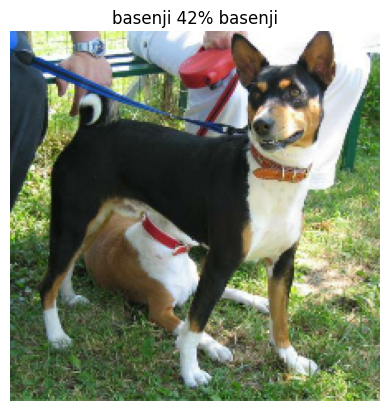

In [43]:
# Visualize the predictions
def plot_pred(prediction_probs, labels, images, n=0):
  pred_prob, true_label, image = prediction_probs[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob) * 100, true_label))
  plt.axis(False)
  plt.show()


plot_pred(predictions, val_labels, val_images, n=np.random.randint(0, len(val_images)))

In [44]:
# Create a function to plot the top 10 highest predicted confidences along with the truth label
def plot_pred_conf(prediction_probs, labels, n=0):
  pred_prob, true_label = prediction_probs[n], labels[n]

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, tick_label=top_10_pred_labels, color='grey')

  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

  plt.title(f"Predicted: {get_pred_label(pred_prob)}")
  plt.ylabel("Prediction Confidence")
  plt.show()


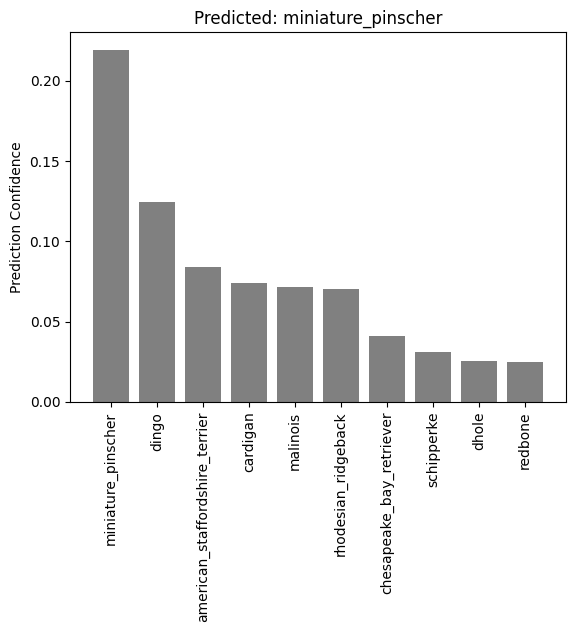

In [45]:
plot_pred_conf(predictions, val_labels, n=np.random.randint(0, len(val_images)))

### Saving and Reloading a Model

In [46]:
# Create a function to save a model
def save_model(model, suffix=None):
  # Create a model direcotry pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/TensorFlow/Dog Vision/models", dt.datetime.now().strftime("%Y%m%d-%H%M%S"))

  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)

  # Return the model path
  return model_path

In [47]:
# Create a function to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})

  # Return the model
  return model

In [48]:
# Save our model
save_model(model, suffix="1000-images")

Saving model to: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-060436-1000-images.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-060436-1000-images.h5'

In [49]:
# Load in our model
loaded_model = load_model('/content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-042616-1000-images.h5')

Loading saved model from: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-042616-1000-images.h5


In [50]:
# Evaluate the loaded model
loaded_model.evaluate(val_data)

7/7 [==============================] - 13s 1s/step - loss: 1.2687 - accuracy: 0.6650


[1.268740177154541, 0.6650000214576721]

### Train a Model on the Full Dataset

In [51]:
# Create a data batch with the full dataset
full_data = create_batches(X, y)

full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [52]:
# Create the model
full_model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Input Layer
    keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Output Layer
])

# Compile the model
full_model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
    metrics=["accuracy"]
)

# Build the model
full_model.build(INPUT_SHAPE)

In [53]:
# Create full model callbacks
tensorboard_full = create_tensorboard_callback()
early_stopping_full = keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [54]:
# Fit the model to all of the data
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[tensorboard_full, early_stopping_full]
)

Epoch 1/100
320/320 [==============================] - 634s 2s/step - loss: 1.3557 - accuracy: 0.6697
Epoch 2/100
320/320 [==============================] - 623s 2s/step - loss: 0.4026 - accuracy: 0.8809
Epoch 3/100
320/320 [==============================] - 623s 2s/step - loss: 0.2391 - accuracy: 0.9351
Epoch 4/100
320/320 [==============================] - 596s 2s/step - loss: 0.1557 - accuracy: 0.9617
Epoch 5/100
320/320 [==============================] - 616s 2s/step - loss: 0.1054 - accuracy: 0.9804
Epoch 6/100
320/320 [==============================] - 605s 2s/step - loss: 0.0783 - accuracy: 0.9875
Epoch 7/100
320/320 [==============================] - 605s 2s/step - loss: 0.0585 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 596s 2s/step - loss: 0.0452 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 593s 2s/step - loss: 0.0375 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 594s 2s/step - loss: 0.031

In [55]:
# Save the full model
save_model(full_model, suffix="full-dataset")

Saving model to: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-095627-full-dataset.h5...


'/content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-095627-full-dataset.h5'

In [57]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-095627-full-dataset.h5")

Loading saved model from: /content/drive/MyDrive/TensorFlow/Dog Vision/models/20241230-095627-full-dataset.h5


### Make Predections with the Model

In [59]:
# Load in the test images
test_path = "/content/drive/MyDrive/TensorFlow/Dog Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]

# Create batches using the test images
test_data = create_batches(test_filenames, test_data=True)

# View the first 10 images in the test data
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [60]:
# Make Predictions using the test data
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 843s 3s/step


In [63]:
# Save the predictions to csv file for later use
np.savetxt("/content/drive/MyDrive/TensorFlow/Dog Vision/test_predictions.csv", test_predictions, delimiter=',')

In [64]:
# Load in the saved predictions
loaded_test_predictions = np.loadtxt("/content/drive/MyDrive/TensorFlow/Dog Vision/test_predictions.csv", delimiter=',')

In [65]:
# View the first 10 predictions
loaded_test_predictions[:10]

array([[4.59312188e-09, 3.08879853e-12, 3.52727021e-08, ...,
        1.05177256e-09, 1.06581456e-06, 6.93146967e-06],
       [1.28973346e-10, 2.68619883e-11, 3.41714851e-10, ...,
        8.25908453e-10, 2.10807105e-08, 7.31264834e-07],
       [4.51078896e-11, 1.11426274e-07, 1.85871268e-05, ...,
        7.78883332e-05, 3.10365316e-08, 3.64569197e-09],
       ...,
       [1.01107733e-10, 9.67872744e-12, 7.02908912e-11, ...,
        8.49238901e-08, 3.15282002e-11, 1.69604053e-11],
       [2.95109466e-08, 9.17663334e-10, 6.34934440e-06, ...,
        1.05714878e-06, 5.84640292e-09, 1.91442404e-10],
       [1.54643658e-07, 3.77959782e-11, 5.43266196e-08, ...,
        2.84144197e-09, 2.40615847e-08, 6.21668587e-04]])

In [66]:
# View the predictions shape
loaded_test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for submission

In [67]:
# Create a pandas df with columns and no rows
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds), index=None)
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [68]:
# Get the id's of each image
image_ids = [os.path.splitext(filepath)[0] for filepath in test_filenames]

# Add the id's to the df
preds_df['id'] = image_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [69]:
# Add the prediction probabilities for each breed
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,4.593122e-09,3.088799e-12,3.527270e-08,8.757196e-15,2.120196e-11,5.466032e-11,5.176917e-09,9.317128e-09,9.005905e-13,...,7.305318e-09,2.007227e-04,2.854143e-13,1.110605e-09,1.766028e-11,1.508218e-11,9.887642e-01,1.051773e-09,1.065815e-06,6.931470e-06
1,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,1.289733e-10,2.686199e-11,3.417149e-10,2.524021e-09,4.968438e-08,1.151828e-11,7.801423e-06,3.232270e-09,2.157025e-09,...,9.330563e-08,1.505732e-07,9.872253e-08,5.041813e-11,2.398323e-11,1.648735e-10,5.718016e-08,8.259085e-10,2.108071e-08,7.312648e-07
2,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,4.510789e-11,1.114263e-07,1.858713e-05,2.548210e-07,5.085489e-07,1.243213e-05,4.404169e-08,3.899731e-10,1.086511e-05,...,2.552776e-08,1.442974e-07,7.839279e-08,4.027478e-05,7.240817e-07,6.192133e-03,1.186715e-07,7.788833e-05,3.103653e-08,3.645692e-09
3,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,4.253093e-12,2.993999e-13,2.551524e-12,3.694156e-13,2.060647e-08,2.667887e-08,1.287136e-09,1.961747e-04,5.825649e-10,...,3.974841e-09,2.457978e-08,1.031979e-09,2.790399e-10,1.168477e-10,1.222689e-09,1.027447e-11,1.130268e-09,3.290092e-08,1.160723e-09
4,/content/drive/MyDrive/TensorFlow/Dog Vision/t...,1.256534e-11,1.287700e-06,7.361668e-11,7.065246e-09,7.525377e-13,8.864890e-07,5.462226e-12,3.555446e-11,7.242360e-09,...,5.979121e-10,2.499877e-13,1.078316e-08,5.545639e-09,3.290844e-09,7.833480e-11,3.631039e-10,5.499833e-11,5.843647e-13,9.615953e-12


In [70]:
# Export df to csv
preds_df.to_csv("/content/drive/MyDrive/TensorFlow/Dog Vision/submission.csv", index=False)

### Making Predictions on custom images

In [71]:
# Get custom images path
custom_path = "/content/drive/MyDrive/TensorFlow/Dog Vision/my-images/"

# Get the images paths
custom_images = [custom_path + fname for fname in os.listdir(custom_path)]

# Create a custom data batch
custom_data = create_batches(custom_images, test_data=True)

# Make predictions using the custom data
custom_preds = loaded_full_model.predict(custom_data, verbose=1)

Creating test data batches...
1/1 [==============================] - 1s 1s/step


In [72]:
# View the custom preds shape
custom_preds.shape

(9, 120)

In [73]:
# Get the custom labels
custom_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_labels

['boston_bull',
 'labrador_retriever',
 'boston_bull',
 'labrador_retriever',
 'labrador_retriever',
 'golden_retriever',
 'redbone',
 'staffordshire_bullterrier',
 'toy_poodle']

In [78]:
# Get custom images using the unbatchify function
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

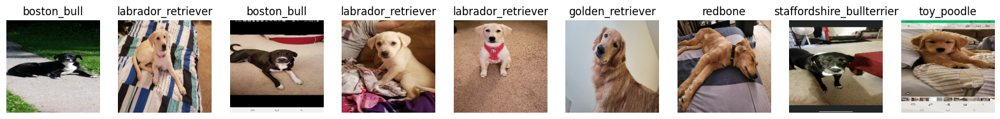

In [80]:
# Check the predictions
plt.figure(figsize=(20, 20))
for i in enumerate(custom_images):
  plt.subplot(1, len(custom_images), i[0]+1)
  plt.title(custom_labels[i[0]])
  plt.axis(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(i[1])